# Laboratory 1 - Covid-19 and vaccination
# Questions 1 -3

---
Date: 26/10/2021
- This laboratory is motivated to understand **how Covid-19 pandemin affect the world**.
- Lab includes: **data analysis** and **data visualization**.
---

## Uppgift 1 - uppvärmning covid-19 data
---

a) Fristly, I import [Covid-19 bekräftade fall][Covid-19] from Folkhälsomyndigheten. 

- In this excel, it is able to get statistics on confirmed cases in Sweden in daily frequency.

- Uppgift 1 requires reading and visualizing sheet "Veckodata Riket". 

[Covid-19]: https://www.folkhalsomyndigheten.se/smittskydd-beredskap/utbrott/aktuella-utbrott/covid-19/statistik-och-analyser/bekraftade-fall-i-sverige/

---

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly_express as px
import plotly.graph_objects as go
from datetime import datetime
from CovidData import CovidData
import plotdata

In [2]:
# Import covid19 sweden dataframe
df_object = CovidData("covid19.xlsx", sheet_name="Veckodata Riket")
# print dataframe information
df_object.parse_data()
print(df_object.show_info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89 entries, 0 to 88
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   år                              89 non-null     int64  
 1   veckonummer                     89 non-null     int64  
 2   Antal_fall_vecka                89 non-null     int64  
 3   Antal_fall_100000inv_vecka      89 non-null     int64  
 4   Antal_fall_100000inv_14dagar    89 non-null     int64  
 5   Kum_antal_fall                  89 non-null     int64  
 6   Kum_fall_100000inv              89 non-null     int64  
 7   Antal_nyaintensivvårdade_vecka  89 non-null     int64  
 8   Kum_antal_intensivvårdade       89 non-null     int64  
 9   Antal_avlidna_vecka             89 non-null     int64  
 10  Antal_avlidna_milj_inv_vecka    89 non-null     float64
 11  Kum_antal_avlidna               89 non-null     int64  
 12  Kum_antal_avlidna_milj_inv      89 non

In [3]:
# There are no missing values
covid19_riket = df_object.parse_data()

In [4]:
covid19_riket["Antal_fall_vecka"].value_counts()

0        2
1        1
33680    1
35306    1
36032    1
        ..
1687     1
2052     1
2014     1
1556     1
4062     1
Name: Antal_fall_vecka, Length: 88, dtype: int64

b) combine "år" and "veckonummer" to a new column with name "Vecka"

In [5]:
covid19_riket["Vecka"] = covid19_riket["år"].astype("str")+"v"+ covid19_riket["veckonummer"].astype("str")
print(covid19_riket)
covid19_riket.head()

      år  veckonummer  Antal_fall_vecka  Antal_fall_100000inv_vecka  \
0   2020            6                 1                           0   
1   2020            7                 0                           0   
2   2020            8                 0                           0   
3   2020            9                13                           0   
4   2020           10               211                           2   
..   ...          ...               ...                         ...   
84  2021           37              6266                          60   
85  2021           38              4298                          41   
86  2021           39              4241                          41   
87  2021           40              4141                          40   
88  2021           41              4062                          39   

    Antal_fall_100000inv_14dagar  Kum_antal_fall  Kum_fall_100000inv  \
0                              0               1                   0   
1  

,år,veckonummer,Antal_fall_vecka,Antal_fall_100000inv_vecka,Antal_fall_100000inv_14dagar,Kum_antal_fall,Kum_fall_100000inv,Antal_nyaintensivvårdade_vecka,Kum_antal_intensivvårdade,Antal_avlidna_vecka,Antal_avlidna_milj_inv_vecka,Kum_antal_avlidna,Kum_antal_avlidna_milj_inv,Vecka
0,2020,6,1,0,0,1,0,0,0,0,0.0,0,0.0,2020v6
1,2020,7,0,0,0,1,0,0,0,0,0.0,0,0.0,2020v7
2,2020,8,0,0,0,1,0,0,0,0,0.0,0,0.0,2020v8
3,2020,9,13,0,0,14,0,0,0,0,0.0,0,0.0,2020v9
4,2020,10,211,2,2,225,2,3,3,0,0.0,0,0.0,2020v10


Draw line charts that show:
- c) deaths per week
- d) new cases per week
- e) both deaths per week and new cases per week
- f) cumulative cases

The tools used should be:
- seaborn
- plotly_express

For the seaborn, I first solve the question partly with loop.

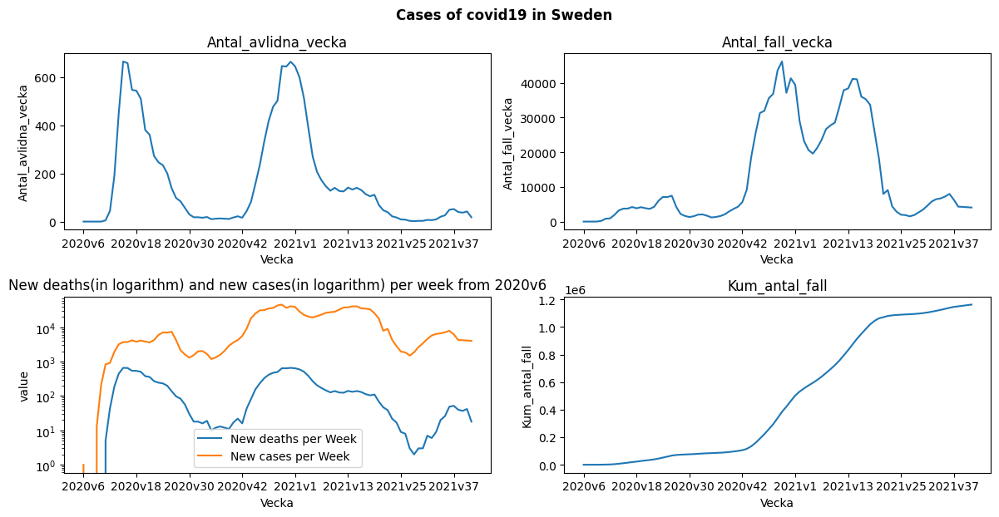

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2,2, dpi=100, figsize=(12,6))

y_variables = ["Antal_avlidna_vecka","Antal_fall_vecka", "Antal_avlidna_vecka", "Kum_antal_fall"]

for ax, y_variable in zip(axes.flatten(), y_variables):
    sns.lineplot(data=covid19_riket, x="Vecka", y=y_variable, ax=ax)
    ax.set(title=f"{y_variable}", ylabel=f"{y_variable}", xticks=covid19_riket["Vecka"][::12])
    plt.grid()

sns.lineplot(data=covid19_riket, x="Vecka", y=y_variables[1], ax=axes[1,0])  
axes[1,0].set(title="New deaths(in logarithm) and new cases(in logarithm) per week from 2020v6", ylabel="value", xticks=covid19_riket["Vecka"][::12])
axes[1,0].set_yscale("log") 
axes[1,0].legend(labels=["New deaths per Week", "New cases per Week"])
        
fig.tight_layout()
fig.suptitle("Cases of covid19 in Sweden", y=1.03, fontweight="bold")
plt.savefig("Visualiseringar/Q1.covid19_sweden.png", facecolor="white")


Now, I am going to define a line plot function use plotly_express to plot the c)-f)

In [7]:
def px_line(dataframe=covid19_riket, x="Vecka", log_y=False, y=None, title=None):
    
    fig = px.line(dataframe, x=x, y=y, markers=True, log_y=log_y,
        title=title,
        labels=dict(Vecka="week"),
        )

    fig.update_layout(hovermode="x")
    fig.update_xaxes(showspikes=True,
                 spikedash="solid",
                 spikemode="across",
                 spikecolor="green",
                 spikesnap="cursor"
                 )
    fig.show()
    fig.write_html(f"Visualiseringar/Q2.{title}.html", auto_open=False)


In [8]:
y_variables = {"Antal_avlidna_vecka": "New deaths per week","Antal_fall_vecka" : "New cases per week", "Antal_avlidna_vecka": "New deaths and new cases per week", "Kum_antal_fall": "Cumulative cases per week"}

for y_variable in y_variables:
    px_line(y=y_variable, title=y_variables[y_variable])

px_line(y=["Antal_avlidna_vecka", "Antal_fall_vecka"], log_y=True, title="New deaths(in logarithm) and new cases(in logarithm) per week from 2020v6")



## Uppgift 2 - uppvärmning vaccindata
---

Now, I import [vaccin.xlsx][link] from **Folkhälsomyndigheten**. 

In this excel, I can find statistics on:
- how many vaccinations have been performed in total.
- how many have been vaccinated against covid-19 in the country, per county and per municipality.

[link]:https://www.folkhalsomyndigheten.se/smittskydd-beredskap/utbrott/aktuella-utbrott/covid-19/statistik-och-analyser/statistik-over-registrerade-vaccinationer-covid-19/

---

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly_express as px
import plotly.graph_objects as go
from datetime import datetime
from CovidData import CovidData
import plotdata

In [10]:
# Import vaccination  dataframe: dataset across kommun and ages
df_object = CovidData("vaccin.xlsx", sheet_name="Vaccinerade kommun och ålder")
# print dataframe information
df_object.parse_data()
print(df_object.show_info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2610 entries, 0 to 2609
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Län                      2610 non-null   int64  
 1   Län_namn                 2610 non-null   object 
 2   Kommun                   2610 non-null   int64  
 3   Kommun_namn              2610 non-null   object 
 4   Ålder                    2610 non-null   object 
 5   Befolkning               2610 non-null   int64  
 6   Antal minst 1 dos        2610 non-null   int64  
 7   Antal färdigvaccinerade  2610 non-null   int64  
 8   Andel minst 1 dos        2610 non-null   float64
 9   Andel färdigvaccinerade  2610 non-null   float64
dtypes: float64(2), int64(5), object(3)
memory usage: 204.0+ KB

        Dataframe info:
None

        Name: vaccin.xlsx

        Sheet name: Vaccinerade kommun och ålder

        Data head():
   Län   Län_namn  Kommun     Kommun_namn  Ålder  Be

In [11]:
vaccin_län_kommun_ålder = df_object.parse_data()

In [12]:
# Now, I define a count_id function to count how many representives in a column in this dataset.
def count_id(dataframe= vaccin_län_kommun_ålder, column=None):
    n_unique = dataframe[column].nunique() 
    #nunique() function count unique values present in a pandas dataframe column.
    #Reference: https://datascienceparichay.com/article/pandas-get-all-unique-values-in-a-column/
    #Alternatively, use unique() function to get a series of unique values, and then len() to get the number of unique values.
    print(f"There are {n_unique} {column} in this dataset.")

a) How many counties are represented in the dataset?

In [13]:
count_id(column = "Län")

There are 21 Län in this dataset.


b) How many municipalities are represented in the dataset?

In [14]:
count_id(column = "Kommun")

There are 290 Kommun in this dataset.


c) How large is the population represented in the dataset?

In [15]:
sum_people = vaccin_län_kommun_ålder["Befolkning"].sum()
print(f"There are {sum_people} representatives in this dataset.")

There are 8541497 representatives in this dataset.


d) Calculate how many children under the age of 16 there are in Sweden. You have to look up statistics on how big the total population is in Sweden.

Firstly, I get the population in Sweden in 2020 from [befolkningsutvecklingen][link] dataset from SCB.

[link]: https://www.statistikdatabasen.scb.se/pxweb/sv/ssd/START__BE__BE0101__BE0101G/BefUtvKon1749/?loadedQueryId=83158&timeType=from&timeValue=2000#

Secondly, I calculate the number of children under 16 years old, by deducting the number of representatives in my vaccin dataset from the total population.

In [16]:
table = pd.read_csv("data/folkmängd.txt", delimiter="\t", encoding='latin1')
print(table)
folkmängd_2020 = table.iloc[2,2]
print(f"The population in Sweden in 2020 is: {folkmängd_2020}")
print(f"The amount of children under 16 years in Sweden in 2020 is: {folkmängd_2020-sum_people}")

       kön    år  Folkmängd
0      män  2020    5222847
1  kvinnor  2020    5156448
2   totalt  2020   10379295
The population in Sweden in 2020 is: 10379295
The amount of children under 16 years in Sweden in 2020 is: 1837798


e) Draw bar graphs for:
- proportion of people who take at least 1 dose per county
- proportion of people who vaccinated 2 doses per county

In [17]:
vaccin_län_kommun_ålder.head()

,Län,Län_namn,Kommun,Kommun_namn,Ålder,Befolkning,Antal minst 1 dos,Antal färdigvaccinerade,Andel minst 1 dos,Andel färdigvaccinerade
0,1,Stockholm,114,Upplands Väsby,16-17,1122,671,450,0.598039,0.401070
1,1,Stockholm,114,Upplands Väsby,18-29,6428,4174,3324,0.649347,0.517113
2,1,Stockholm,114,Upplands Väsby,30-39,7088,4976,4341,0.702032,0.612444
3,1,Stockholm,114,Upplands Väsby,40-49,6802,5308,5010,0.780359,0.736548
4,1,Stockholm,114,Upplands Väsby,50-59,6185,5360,5190,0.866613,0.839127


In [18]:
vaccin_län = vaccin_län_kommun_ålder.groupby(["Län_namn"])[["Befolkning", "Antal minst 1 dos", "Antal färdigvaccinerade"]].sum()
vaccin_län["Andel minst 1 dos"] = (vaccin_län["Antal minst 1 dos"]/vaccin_län["Befolkning"]).round(2)
vaccin_län["Andel färdigvaccinerade"] = (vaccin_län["Antal färdigvaccinerade"]/vaccin_län["Befolkning"]).round(2)
vaccin_län.head()

,Befolkning,Antal minst 1 dos,Antal färdigvaccinerade,Andel minst 1 dos,Andel färdigvaccinerade
Län_namn,,,,,
Blekinge,132463,114711,110497,0.87,0.83
Dalarna,238920,207596,198688,0.87,0.83
Gotland,50863,46143,44359,0.91,0.87
Gävleborg,239812,205563,193853,0.86,0.81
Halland,275840,239400,230634,0.87,0.84


In [19]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_bar(x=vaccin_län.index, y=vaccin_län["Andel minst 1 dos"], name="Andel med minst 1 dos per län",
              text="Andel minst 1 dos")

fig.add_bar(x=vaccin_län.index, y=vaccin_län["Andel färdigvaccinerade"], 
       name="Andel färdigvaccinerade per län", text="Andel färdigvaccinerade")

fig.update_layout(
    xaxis_title='Län',
    yaxis_title='Andel',
    title="Andel med minst 1 dos och färdigvaccinerade per län"
    )

fig.update_traces(textposition='outside')

fig.show()
fig.write_html(f"Visualiseringar/Q2.Andel med minst 1 dos och färdigvaccinerade per län.html", auto_open=False)


f) Draw a bar chart with counties in the x-axis and bars for population> 16 years, number at least 1 dose and number
fully vaccinated

In [20]:
import plotly.graph_objects as go
#from plotly.subplots import make_subplots

fig = go.Figure()

fig.add_bar(name="Befolkning > 16 år", x=vaccin_län.index, y=vaccin_län["Befolkning"])
fig.add_bar(name='Antal färdigvaccinerade', x=vaccin_län.index, y=vaccin_län["Antal färdigvaccinerade"])
fig.add_bar(name='Antal minst 1 dos', x=vaccin_län.index, y=vaccin_län["Antal minst 1 dos"])
      
fig.update_layout(
    xaxis_title='Län',
    yaxis_title='Antal',
    title="Q2.f Befolkning, antal färdigvaccinerade, och antal minst 1 dos per län"
    )

fig.show()
fig.write_html(
    f"Visualiseringar/Q2.Befolkning, antal färdigvaccinerade, och antal minst 1 dos per län.html", auto_open=False)

## Question 3: KPIer & explorativ dataanalys för vaccinering i Sverige/Kommun

---
This section is intented to present 3-6 KPIer and implement data analysis.

**KPIs on the vaccination status across ages across läns.**
- the amount of people who take 1 dos.
- the amount of people who take both dos 1 and dos 2.
- the percentage of people who take 1 dos within the age group within the län.
- the percentage of people who take both doses within the age group within the län.

**KPIs on the effect of vaccination across different läns:**
- the cases of new cases across läns
- the cases of new deaths across läns
- the cases of new intensive hospital care across läns
- the total cases across läns


**The last KPI is regarding the relation between the vaccination status and the covid19 cases:**
- The number of new death cases vs the amount of dos 1
- The procent of new deaths with respect to new cases vs the amount of dos 1


In [21]:
vaccin_län_kommun_ålder.head()

,Län,Län_namn,Kommun,Kommun_namn,Ålder,Befolkning,Antal minst 1 dos,Antal färdigvaccinerade,Andel minst 1 dos,Andel färdigvaccinerade
0,1,Stockholm,114,Upplands Väsby,16-17,1122,671,450,0.598039,0.401070
1,1,Stockholm,114,Upplands Väsby,18-29,6428,4174,3324,0.649347,0.517113
2,1,Stockholm,114,Upplands Väsby,30-39,7088,4976,4341,0.702032,0.612444
3,1,Stockholm,114,Upplands Väsby,40-49,6802,5308,5010,0.780359,0.736548
4,1,Stockholm,114,Upplands Väsby,50-59,6185,5360,5190,0.866613,0.839127


**KPIs on the vaccination status across ages across läns.**
- the amount of people who take 1 dos.
- the amount of people who take both dos 1 and dos 2.
- the percentage of people who take 1 dos within the age group within the län.
- the percentage of people who take both doses within the age group within the län.

In [22]:
y_variables_dos = {"Antal minst 1 dos":"Antal med minst 1 dos per län per ålder", "Antal färdigvaccinerade": "Antal färdigvaccinerade per län per ålder",
"Andel minst 1 dos":"Andel med minst 1 dos per län per ålder", "Andel färdigvaccinerade": "Andel färdigvaccinerade per län per ålder" }

for y_variable_dos in y_variables_dos:
       fig = px.bar(vaccin_län_kommun_ålder, x="Län_namn", y=y_variable_dos, color="Ålder", barmode="group",
       title=y_variables_dos[y_variable_dos], labels=dict(Län_namn="län")
       )

       fig.show()
       fig.write_html(f"Visualiseringar/Q3.{y_variables_dos[y_variable_dos]}.html", auto_open=False)

**KPIs on the effect of vaccination across different läns:**

Now I am goint to show the time series figures for:
- the cases of new cases across läns
- the cases of new deaths across läns
- the cases of new intensive hospital care across läns
- the total cases across läns

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly_express as px
import plotly.graph_objects as go
from datetime import datetime
from CovidData import CovidData

In [24]:
# Import covid19 Region dataframe
df_object = CovidData("covid19.xlsx", sheet_name="Veckodata Region")
# print dataframe information
df_object.parse_data()
print(df_object.show_info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1974 entries, 0 to 1973
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   år                           1974 non-null   int64 
 1   veckonummer                  1974 non-null   int64 
 2   Region                       1974 non-null   object
 3   Antal_fall_vecka             1974 non-null   int64 
 4   Kum_antal_fall               1974 non-null   int64 
 5   Antal_intensivvårdade_vecka  1974 non-null   int64 
 6   Kum_antal_intensivvårdade    1974 non-null   int64 
 7   Antal_avlidna_vecka          1974 non-null   int64 
 8   Kum_antal_avlidna            1974 non-null   int64 
 9   Antal_fall_100000inv_vecka   1974 non-null   int64 
 10  Kum_fall_100000inv           1974 non-null   int64 
dtypes: int64(10), object(1)
memory usage: 169.8+ KB

        Dataframe info:
None

        Name: covid19.xlsx

        Sheet name: Veckodata Region

  

In [25]:
covid19_län = df_object.parse_data()
covid19_län["Vecka"] = covid19_län["år"].astype("str")+"v"+ covid19_län["veckonummer"].astype("str")
covid19_län.head()

,år,veckonummer,Region,Antal_fall_vecka,Kum_antal_fall,Antal_intensivvårdade_vecka,Kum_antal_intensivvårdade,Antal_avlidna_vecka,Kum_antal_avlidna,Antal_fall_100000inv_vecka,Kum_fall_100000inv,Vecka
0,2020,1,Blekinge,0,0,0,0,0,0,0,0,2020v1
1,2020,2,Blekinge,0,0,0,0,0,0,0,0,2020v2
2,2020,3,Blekinge,0,0,0,0,0,0,0,0,2020v3
3,2020,4,Blekinge,0,0,0,0,0,0,0,0,2020v4
4,2020,5,Blekinge,0,0,0,0,0,0,0,0,2020v5


In [26]:
y_variables = {"Antal_avlidna_vecka": "New deaths per week per län", "Antal_fall_vecka": "New cases per week per län", "Antal_intensivvårdade_vecka": "New intensive health cares per week per län",
               "Kum_antal_avlidna": "Cumulative deaths per week per län", "Kum_antal_fall": "Cumulative cases per week per län",
               "Kum_antal_intensivvårdade": "Cumulative intensive health cares per week per län"}
plotdata.time_series_plot(df = covid19_län, y_variables = y_variables)

**The last group of KPIs is regarding the Mortality Risk of COVID-19**

I will use the following KPIs, inspired by [Mortality Risk of COVID-19][link]:

[link]: https://ourworldindata.org/mortality-risk-covid

- **The case fatality rate (CFR)** is simply the number of confirmed deaths divided by the number of confirmed cases.

The Case Fatality Rate does not reflect exactly the risk of dying from COVID-19, since the number of confirmed cases is not the number of infected cases. Some reasons can lead to that people are not able to confirm whether they are infected or not, for example, short of hospital care.

- **Case_intensivecare_rate** is the number of intensive cares divided by the number of confirmed cases.



- **Crude mortality rate** measures the share among the entire population that have died from a particular disease. It’s calculated by dividing the number of deaths from the disease by the total population.



The **steps** to acchieve my goals are:

- I will first construct a dataframe including the vaccinatin status, covid19 over läns over time.

- I will show these KPIs in time series way.

The **findings** are:

- I will present a roughly negative relation between the vaccination status and mortality risk of covid-19,
however, this negative relation disappear around week 25 and week 38 in 2021.
It seems that the covid 19 fatality and amount increase even though the vaccination rate is pretty higher.
Probably some vaccinations lose their effects after a certain periods, say three months.

- I notice that all figures show that there is a backwards of Covid19 around week 25 and week 38 in 2021.




In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly_express as px
import plotly.graph_objects as go
from datetime import datetime
from CovidData import CovidData
import plotdata

In [28]:
# Import vaccination time series dataframe
df_object = CovidData("vaccin.xlsx", sheet_name="Vaccinerade tidsserie")
# print dataframe information
df_object.parse_data()
print(df_object.show_info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1892 entries, 0 to 1891
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Vecka               1892 non-null   int64  
 1   År                  1892 non-null   int64  
 2   Region              1892 non-null   object 
 3   Antal vaccinerade   1892 non-null   int64  
 4   Andel vaccinerade   1892 non-null   float64
 5   Vaccinationsstatus  1892 non-null   object 
dtypes: float64(1), int64(3), object(2)
memory usage: 88.8+ KB

        Dataframe info:
None

        Name: vaccin.xlsx

        Sheet name: Vaccinerade tidsserie

        Data head():
   Vecka    År       Region  Antal vaccinerade  Andel vaccinerade  \
0     52  2020  | Sverige |               2472           0.000289   
1     52  2020  | Sverige |                  0           0.000000   
2     52  2020    Stockholm                288           0.000148   
3     52  2020    Stockholm              

In [29]:
vaccin_län = df_object.parse_data()
vaccin_län["Vecka"] = vaccin_län["År"].astype("str")+"v"+ vaccin_län["Vecka"].astype("str")
vaccin_län.head()

,Vecka,År,Region,Antal vaccinerade,Andel vaccinerade,Vaccinationsstatus
0,2020v52,2020,| Sverige |,2472,0.000289,Minst 1 dos
1,2020v52,2020,| Sverige |,0,0.000000,Färdigvaccinerade
2,2020v52,2020,Stockholm,288,0.000148,Minst 1 dos
3,2020v52,2020,Stockholm,0,0.000000,Färdigvaccinerade
4,2020v52,2020,Uppsala,8,0.000025,Minst 1 dos


In [30]:
vaccin_1dos_län = vaccin_län[vaccin_län["Vaccinationsstatus"]=="Minst 1 dos"].reset_index(drop=True)
vaccin_1dos_län.head()

,Vecka,År,Region,Antal vaccinerade,Andel vaccinerade,Vaccinationsstatus
0,2020v52,2020,| Sverige |,2472,0.000289,Minst 1 dos
1,2020v52,2020,Stockholm,288,0.000148,Minst 1 dos
2,2020v52,2020,Uppsala,8,0.000025,Minst 1 dos
3,2020v52,2020,Södermanland,116,0.000474,Minst 1 dos
4,2020v52,2020,Östergötland,214,0.000554,Minst 1 dos


In [31]:
vaccin_2dos_län = vaccin_län[vaccin_län["Vaccinationsstatus"]=="Färdigvaccinerade"].reset_index(drop=True)
vaccin_2dos_län.head()

,Vecka,År,Region,Antal vaccinerade,Andel vaccinerade,Vaccinationsstatus
0,2020v52,2020,| Sverige |,0,0.0,Färdigvaccinerade
1,2020v52,2020,Stockholm,0,0.0,Färdigvaccinerade
2,2020v52,2020,Uppsala,0,0.0,Färdigvaccinerade
3,2020v52,2020,Södermanland,0,0.0,Färdigvaccinerade
4,2020v52,2020,Östergötland,0,0.0,Färdigvaccinerade


In [32]:
## I want to merge vaccin_1dos_län and vaccin_2dos_län
vaccin_län = vaccin_1dos_län.merge(vaccin_2dos_län, on=["Vecka", "Region"], how="outer", indicator=True, suffixes=["_1dos","_2dos"])
vaccin_län = vaccin_län[["Vecka", "Region", "Antal vaccinerade_1dos", "Andel vaccinerade_1dos", "Antal vaccinerade_2dos", "Andel vaccinerade_2dos"]]
vaccin_län.head()

,Vecka,Region,Antal vaccinerade_1dos,Andel vaccinerade_1dos,Antal vaccinerade_2dos,Andel vaccinerade_2dos
0,2020v52,| Sverige |,2472,0.000289,0,0.0
1,2020v52,Stockholm,288,0.000148,0,0.0
2,2020v52,Uppsala,8,0.000025,0,0.0
3,2020v52,Södermanland,116,0.000474,0,0.0
4,2020v52,Östergötland,214,0.000554,0,0.0


In [33]:
# Now I am going to get covid19 data for both the whole country and all läns
covid19_sverige = covid19_riket[["Vecka", "Antal_fall_vecka", "Antal_nyaintensivvårdade_vecka", "Antal_avlidna_vecka"]]
covid19_sverige = covid19_sverige.rename(columns={"Antal_nyaintensivvårdade_vecka":"Antal_intensivvårdade_vecka"})
covid19_sverige["Region"] = "| Sverige |"
covid19_sverige.head()

,Vecka,Antal_fall_vecka,Antal_intensivvårdade_vecka,Antal_avlidna_vecka,Region
0,2020v6,1,0,0,| Sverige |
1,2020v7,0,0,0,| Sverige |
2,2020v8,0,0,0,| Sverige |
3,2020v9,13,0,0,| Sverige |
4,2020v10,211,3,0,| Sverige |


In [34]:
covid19_län_s = covid19_län[["Vecka", "Region", "Antal_fall_vecka", "Antal_intensivvårdade_vecka", "Antal_avlidna_vecka"]]
covid19_län_s.head()

,Vecka,Region,Antal_fall_vecka,Antal_intensivvårdade_vecka,Antal_avlidna_vecka
0,2020v1,Blekinge,0,0,0
1,2020v2,Blekinge,0,0,0
2,2020v3,Blekinge,0,0,0
3,2020v4,Blekinge,0,0,0
4,2020v5,Blekinge,0,0,0


In [35]:
covid19 = pd.concat([covid19_sverige, covid19_län_s]).reset_index(drop=True)
covid19.head()

,Vecka,Antal_fall_vecka,Antal_intensivvårdade_vecka,Antal_avlidna_vecka,Region
0,2020v6,1,0,0,| Sverige |
1,2020v7,0,0,0,| Sverige |
2,2020v8,0,0,0,| Sverige |
3,2020v9,13,0,0,| Sverige |
4,2020v10,211,3,0,| Sverige |


In [36]:
# Now I merge vaccine and covid19 data
vaccin_covid19 = vaccin_län.merge(covid19, on=["Vecka", "Region"], how="inner", indicator=True)
vaccin_covid19.head()

,Vecka,Region,Antal vaccinerade_1dos,Andel vaccinerade_1dos,Antal vaccinerade_2dos,Andel vaccinerade_2dos,Antal_fall_vecka,Antal_intensivvårdade_vecka,Antal_avlidna_vecka,_merge
0,2020v52,| Sverige |,2472,0.000289,0,0.0,37134,206,643,both
1,2020v52,Stockholm,288,0.000148,0,0.0,7461,52,130,both
2,2020v52,Uppsala,8,0.000025,0,0.0,1204,5,16,both
3,2020v52,Östergötland,214,0.000554,0,0.0,889,10,20,both
4,2020v52,Jönköping,43,0.000144,0,0.0,1167,12,29,both


In [37]:
vaccin_covid19["_merge"].describe()

count      860
unique       1
top       both
freq       860
Name: _merge, dtype: object

In [38]:
vaccin_covid19.pop("_merge")
vaccin_covid19.head()

,Vecka,Region,Antal vaccinerade_1dos,Andel vaccinerade_1dos,Antal vaccinerade_2dos,Andel vaccinerade_2dos,Antal_fall_vecka,Antal_intensivvårdade_vecka,Antal_avlidna_vecka
0,2020v52,| Sverige |,2472,0.000289,0,0.0,37134,206,643
1,2020v52,Stockholm,288,0.000148,0,0.0,7461,52,130
2,2020v52,Uppsala,8,0.000025,0,0.0,1204,5,16
3,2020v52,Östergötland,214,0.000554,0,0.0,889,10,20
4,2020v52,Jönköping,43,0.000144,0,0.0,1167,12,29


In [39]:
vaccin_covid19.describe()

,Antal vaccinerade_1dos,Andel vaccinerade_1dos,Antal vaccinerade_2dos,Andel vaccinerade_2dos,Antal_fall_vecka,Antal_intensivvårdade_vecka,Antal_avlidna_vecka
count,8.600000e+02,860.000000,8.600000e+02,860.000000,860.000000,860.000000,860.000000
mean,3.525957e+05,0.440342,2.339788e+05,0.294547,1776.780233,9.159302,14.094186
std,9.980845e+05,0.323416,7.588400e+05,0.289620,5144.741888,27.868876,54.342652
min,0.000000e+00,0.000000,0.000000e+00,0.000000,3.000000,0.000000,0.000000
25%,2.824225e+04,0.102328,1.034450e+04,0.039255,117.500000,0.000000,0.000000
50%,1.136745e+05,0.448014,5.102950e+04,0.149836,452.000000,2.000000,2.000000
75%,2.046118e+05,0.788923,1.595142e+05,0.530120,1126.500000,6.000000,7.250000
max,7.212619e+06,0.907891,6.791446e+06,0.872196,41323.000000,250.000000,663.000000


In [40]:
län_befolkning = vaccin_län_kommun_ålder.groupby(["Län_namn"])["Befolkning"].sum().reset_index()
län_befolkning = län_befolkning.rename(columns={"Län_namn": "Region"})
län_befolkning.loc[len(län_befolkning.index)] = ["| Sverige |", län_befolkning["Befolkning"].sum()]
län_befolkning

,Region,Befolkning
0,Blekinge,132463
1,Dalarna,238920
2,Gotland,50863
3,Gävleborg,239812
4,Halland,275840
5,Jämtland,108953
6,Jönköping,298157
7,Kalmar,205281
8,Kronoberg,165291
9,Norrbotten,211129


In [41]:
vaccin_covid19 = vaccin_covid19.merge(län_befolkning, how="left" , on="Region")
vaccin_covid19.head()

,Vecka,Region,Antal vaccinerade_1dos,Andel vaccinerade_1dos,Antal vaccinerade_2dos,Andel vaccinerade_2dos,Antal_fall_vecka,Antal_intensivvårdade_vecka,Antal_avlidna_vecka,Befolkning
0,2020v52,| Sverige |,2472,0.000289,0,0.0,37134,206,643,8541497
1,2020v52,Stockholm,288,0.000148,0,0.0,7461,52,130,1951266
2,2020v52,Uppsala,8,0.000025,0,0.0,1204,5,16,319391
3,2020v52,Östergötland,214,0.000554,0,0.0,889,10,20,385978
4,2020v52,Jönköping,43,0.000144,0,0.0,1167,12,29,298157


In [42]:
vaccin_covid19["Case_intensivecare_rate"] = vaccin_covid19["Antal_intensivvårdade_vecka"]/vaccin_covid19["Antal_fall_vecka"].round(3)
vaccin_covid19["Case_fatality_rate(CFR)"] = vaccin_covid19["Antal_avlidna_vecka"]/vaccin_covid19["Antal_fall_vecka"].round(3)
vaccin_covid19["Crude_mortality_rate"] = vaccin_covid19["Antal_avlidna_vecka"]/vaccin_covid19["Befolkning"].round(3)
vaccin_covid19.head()

,Vecka,Region,Antal vaccinerade_1dos,Andel vaccinerade_1dos,Antal vaccinerade_2dos,Andel vaccinerade_2dos,Antal_fall_vecka,Antal_intensivvårdade_vecka,Antal_avlidna_vecka,Befolkning,Case_intensivecare_rate,Case_fatality_rate(CFR),Crude_mortality_rate
0,2020v52,| Sverige |,2472,0.000289,0,0.0,37134,206,643,8541497,0.005547,0.017316,0.000075
1,2020v52,Stockholm,288,0.000148,0,0.0,7461,52,130,1951266,0.006970,0.017424,0.000067
2,2020v52,Uppsala,8,0.000025,0,0.0,1204,5,16,319391,0.004153,0.013289,0.000050
3,2020v52,Östergötland,214,0.000554,0,0.0,889,10,20,385978,0.011249,0.022497,0.000052
4,2020v52,Jönköping,43,0.000144,0,0.0,1167,12,29,298157,0.010283,0.024850,0.000097


In [43]:
y_variables = {"Case_intensivecare_rate": "The percentage of intensive cares to confirmed cases",
               "Case_fatality_rate(CFR)": "The percentage of confirmed deaths to confirmed cases",
               "Crude_mortality_rate": "The rate of confirmed deaths to population",
               }

plotdata.time_series_plot(df = vaccin_covid19, y_variables = y_variables)
plotdata.scatter_plot(df=vaccin_covid19, x ="Andel vaccinerade_1dos", y_variables = y_variables)
plotdata.scatter_plot(df=vaccin_covid19, x ="Andel vaccinerade_2dos", y_variables = y_variables)

In [44]:
y_variables = {"Antal_avlidna_vecka": "New deaths per week per län",
               "Antal_fall_vecka": "New cases per week per län", 
               "Antal_intensivvårdade_vecka": "New intensive health cares per week per län",
               }

plotdata.scatter_plot(
    df=vaccin_covid19, x="Antal vaccinerade_1dos", y_variables=y_variables)
plotdata.scatter_plot(
    df=vaccin_covid19, x="Antal vaccinerade_2dos", y_variables=y_variables)
